In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 6.0 MB/s eta 0:00:00


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=28b324b4ee6bf2dacf6c23a6d33ad22d3133354732481fec86b26de42a832b3e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import random
import shap
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error as MSE
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = load_breast_cancer()
feature_names = data.feature_names
print("The features in the data are:", feature_names)
print(" \nThe target is:",data.target_names)

The features in the data are: ['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']
 
The target is: ['malignant' 'benign']


In [ ]:
X, y = load_breast_cancer(return_X_y=True, as_frame=True)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y, test_size=0.3)

In [ ]:
model_MLP = MLPClassifier().fit(X_train, y_train)
y_pred_MLP = model_MLP.predict(X_test)
accuracy_MLP = accuracy_score(y_test, y_pred_MLP)
print('accuracy of MLP is:',accuracy_MLP)

accuracy of MLP is: 0.9766081871345029


# LIME

In [ ]:
class LIMEValueEstimator:
    def __init__(self, model, data, bandwidth=0.75):
        self.model = model
        self.data = data
        self.bandwidth = bandwidth

    def explain_instance(self, instance_index=None):
        if instance_index is None:
            instance_index = np.random.randint(0, self.data.shape[0])
        instance_to_explain = self.data.iloc[instance_index]
        samples = self.sample_around(instance_to_explain)
        weights = self.compute_weights(instance_to_explain, samples)
        local_model = self.fit_local_model(samples, weights)
        coefficients = local_model.coef_
        return coefficients * instance_to_explain

    def sample_around(self, instance_to_explain, num_samples=1000, scale=1):
        num_features = self.data.shape[1]
        samples = np.zeros((num_samples, num_features))
        for i in range(num_samples):
            for j in range(num_features):
                # Generating random sample from a normal distribution
                random_sample = np.random.normal(0, scale)
                samples[i][j] = random_sample + instance_to_explain.values[j]
        samples_df = pd.DataFrame(samples, columns=self.data.columns)
        return samples_df

    def compute_weights(self, instance_to_explain, samples):
        num_samples = samples.shape[0]
        norms = np.zeros(num_samples)
        for i in range(num_samples):
            squared_diff = 0
            for j in range(samples.shape[1]):
                squared_diff += (instance_to_explain[j] - samples.iloc[i][j]) ** 2
            norms[i] = squared_diff
        scaled_bandwidth = self.bandwidth * np.sqrt(self.data.shape[1])
        weights = np.exp(-(norms) / (scaled_bandwidth ** 2))
        return weights

    def fit_local_model(self, samples, weights):
        num_samples = samples.shape[0]
        actual_probabilities = np.zeros(num_samples)
        MLP_probabilities = self.model.predict_proba(samples)[:, 1]
        for i in range(num_samples):
            actual_probabilities[i] += MLP_probabilities[i]
        local_model = LinearRegression()
        local_model.fit(samples, actual_probabilities, sample_weight=weights)
        return local_model

In [ ]:
lime_explainer = LIMEValueEstimator(model_MLP, X_train, bandwidth=0.75)
coefficients = lime_explainer.explain_instance(instance_index=0)
print('These are the calculated LIME coeffiecients:')
print(coefficients)

These are the calculated LIME coeffiecients:
mean radius                0.003904
mean texture               0.011779
mean perimeter             0.002622
mean area                  0.000433
mean smoothness           -0.000272
mean compactness          -0.000295
mean concavity             0.006149
mean concave points        0.001341
mean symmetry             -0.000097
mean fractal dimension    -0.000102
radius error               0.004611
texture error             -0.002559
perimeter error            0.003523
area error                 0.002287
smoothness error           0.000256
compactness error         -0.002871
concavity error            0.001567
concave points error      -0.001110
symmetry error            -0.001769
fractal dimension error   -0.001642
worst radius               0.007384
worst texture              0.017971
worst perimeter            0.005431
worst area                 0.006750
worst smoothness          -0.001277
worst compactness          0.002211
worst concavity    

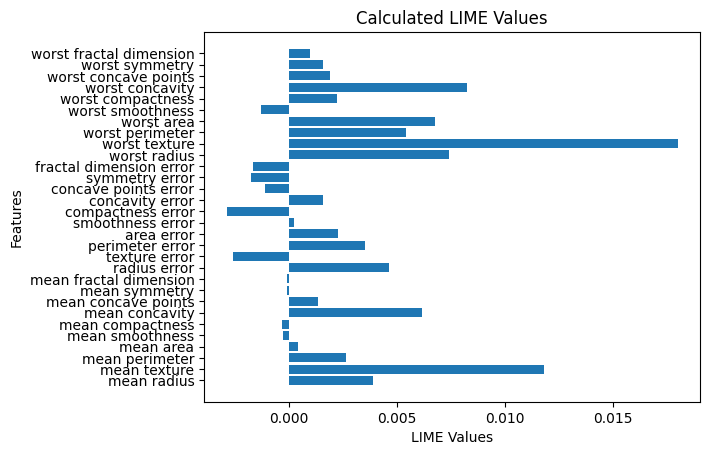

In [ ]:
features = X.columns
plt.barh(features, coefficients)
plt.xlabel('LIME Values')
plt.ylabel('Features')
plt.title('Calculated LIME Values')
plt.show()

In [ ]:
explainer=lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=feature_names, mode='classification')

In [ ]:
exp=explainer.explain_instance(X_test.iloc[0], model_MLP.predict_proba, num_features=30)
exp.show_in_notebook(show_table=True)

In [ ]:
# Print explanations obtained using LIME
print("LIME Explanations:\n")
for feature, value in exp.as_list():
    print(f"{feature}: {value}")

LIME Explanations:

worst smoothness > 0.60: -0.23954931638024954
worst area > 0.41: -0.20676057085049143
worst symmetry > 0.49: -0.18473836925103904
worst radius > 0.60: -0.172874871740107
worst concavity > 0.56: -0.1648769048743998
mean concave points > 0.72: -0.1634393784690541
radius error > 0.26: -0.1593133343075301
compactness error > 0.44: 0.1526484035156621
mean concavity > 0.58: -0.1411585594486772
area error > 0.11: -0.1288948676950319
mean radius > 0.55: -0.11674733350943266
mean perimeter > 0.52: -0.1124087054195617
worst concave points > 0.78: -0.11050448421463634
mean area > 0.41: -0.10970496419913524
mean texture > 0.56: -0.10081919227757695
worst fractal dimension > 0.48: -0.09558554131496379
perimeter error > 0.26: -0.09178340726549686
worst perimeter > 0.58: -0.09011157729892287
-0.07 < worst texture <= 0.74: -0.04478942986456718
mean smoothness > 0.68: -0.03656845073829152
mean symmetry > 0.53: 0.029695633495748438
-0.69 < texture error <= -0.25: -0.02954512065204825

# SHAP

In [ ]:
class ShapleyValueEstimator(object):
    def __init__(self, dataset, target_function):
        self.dataset = dataset
        self.target_function = target_function
        self.num_features = dataset.shape[-1]
        self.feature_indices = list(range(dataset.shape[-1]))

    def _generate_random_instance(self):
        random_index = np.random.randint(0, len(self.dataset))
        random_row = self.dataset.iloc[random_index].values
        return random_row

    def get_updated_instances(self, reference_point, feature_index, random_instance, features_except_j):
        sample_size = random.choice(features_except_j)
        sample = random.sample(features_except_j, sample_size)
        inc_feature = np.zeros((1, self.num_features))
        exc_feature = np.zeros((1, self.num_features))
        for k in self.feature_indices:
            if k in sample + [feature_index]:
                inc_feature[0][k] = reference_point[k]
                exc_feature[0][k] = reference_point[k]
            else:
                inc_feature[0][k] = random_instance[k]
                exc_feature[0][k] = random_instance[k]
        exc_feature[0][feature_index] = random_instance[feature_index]
        return inc_feature, exc_feature

    def compute_shapley_estimates_for_feature(self, feature_index, reference_point, features_except_j, num_samples):
        shapley_estimates_for_feature = []
        for _ in range(num_samples):
            random_instance = self._generate_random_instance()
            inc_feature, exc_feature = self.get_updated_instances(reference_point, feature_index, random_instance, features_except_j)
            diff=self.target_function(inc_feature) - self.target_function(exc_feature)
            shapley_estimates_for_feature.append(diff)
        return shapley_estimates_for_feature

    def generate_MC_estimates(self, reference_point, feature_indices_to_examine, num_samples):
        shapley_estimates = []
        for feature_index in feature_indices_to_examine:
            features_except_j = list(filter(lambda i: i != feature_index, self.feature_indices))
            shapley_estimates_for_feature = self.compute_shapley_estimates_for_feature(
                feature_index, reference_point, features_except_j, num_samples)
            shapley_estimates.append(np.mean(shapley_estimates_for_feature))
        return shapley_estimates

    def compute_shapley_values(self, reference_point, num_samples=1000):
        features_to_examine = self.feature_indices
        shapley_values = self.generate_MC_estimates(reference_point, features_to_examine, num_samples)
        return np.array(shapley_values)


In [ ]:
# taking an arbitary row of the data as an instance
x = X_test.iloc[0]

In [ ]:
# using our implemneted Shapley Class to find out the shapley values correspoding to each feature for explaining our prediction on the instance
shap_instance = ShapleyValueEstimator(X_train, lambda x : model_MLP.predict_proba(x)[0, 1])
shapely_calc_values = shap_instance.compute_shapley_values(x)
print('The calculated Shapely Values for features are:')
shapely_calc_values

The calculated Shapely Values for features are:


array([-0.03863388, -0.01452963, -0.04119798, -0.03609894, -0.00971878,
       -0.00177983, -0.0491772 , -0.04642001,  0.00181865,  0.00609133,
       -0.02092561, -0.00409114, -0.01011144, -0.02051771,  0.00117412,
        0.01419221, -0.00275312,  0.00094364,  0.00108413, -0.00128206,
       -0.05628242, -0.02464191, -0.02717549, -0.0597062 , -0.02531911,
       -0.00542516, -0.04539281, -0.03826857, -0.04207255, -0.01422061])

In [ ]:
shap_df = pd.DataFrame(list(zip(feature_names, shapely_calc_values)), columns=['Feature', 'SHAP Value'])
shap_df

,Feature,SHAP Value
0,mean radius,-0.038634
1,mean texture,-0.014530
2,mean perimeter,-0.041198
3,mean area,-0.036099
4,mean smoothness,-0.009719
5,mean compactness,-0.001780
6,mean concavity,-0.049177
7,mean concave points,-0.046420
8,mean symmetry,0.001819
9,mean fractal dimension,0.006091


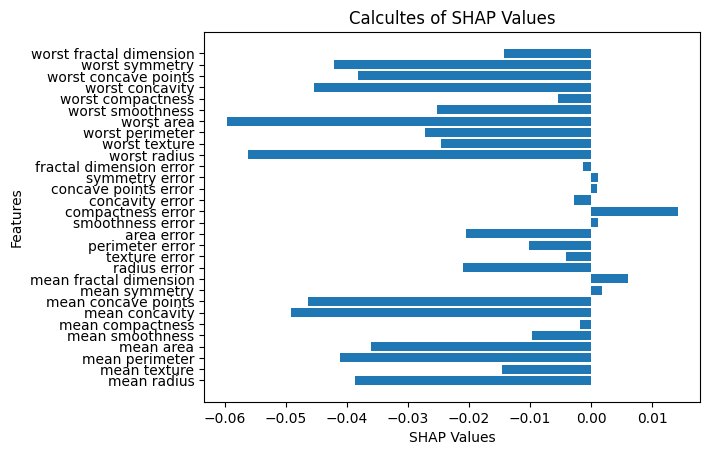

In [ ]:
features = X.columns
plt.barh(features, shapely_calc_values)
plt.xlabel('SHAP Values')
plt.ylabel('Features')
plt.title('Calcultes of SHAP Values')
plt.show()

In [ ]:
# using the actual SHAP library to explain the same prediction
explainer = shap.KernelExplainer(lambda x: model_MLP.predict_proba(x)[:, 1], X_train)
shap_actual_values = explainer.shap_values(x)
shap_actual_values

array([-0.04198231, -0.01835353, -0.03318628, -0.03595691, -0.00621801,
        0.        , -0.03752578, -0.05277977,  0.        ,  0.00522073,
       -0.0197559 , -0.00260089, -0.0147029 , -0.02021733, -0.00067969,
        0.01371645, -0.00561465,  0.        ,  0.        ,  0.        ,
       -0.05096622, -0.02860524, -0.03083427, -0.06808451, -0.03425896,
       -0.00230058, -0.05044925, -0.0294715 , -0.0315378 , -0.01594166])

In [ ]:
# comparing our calculaed vs the actual shap value
shap_df = pd.DataFrame(list(zip(feature_names, shapely_calc_values, shap_actual_values)), columns=['Feature', 'SHAP Calculated Value', 'SHAP Actual Value'])
shap_df

,Feature,SHAP Calculated Value,SHAP Actual Value
0,mean radius,-0.038634,-0.041982
1,mean texture,-0.014530,-0.018354
2,mean perimeter,-0.041198,-0.033186
3,mean area,-0.036099,-0.035957
4,mean smoothness,-0.009719,-0.006218
5,mean compactness,-0.001780,0.000000
6,mean concavity,-0.049177,-0.037526
7,mean concave points,-0.046420,-0.052780
8,mean symmetry,0.001819,0.000000
9,mean fractal dimension,0.006091,0.005221


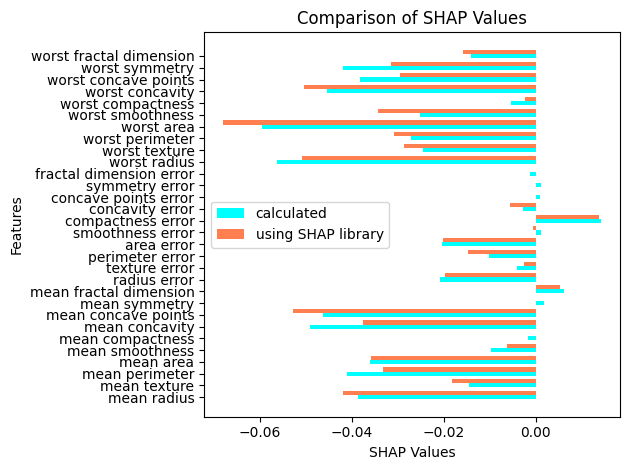

In [ ]:
features = X.columns
bar_width = 0.35
index = np.arange(len(features))

plt.barh(index, shapely_calc_values, bar_width, label='calculated', color='cyan')
plt.barh(index + bar_width, shap_actual_values, bar_width, label="using SHAP library", color='coral')

plt.xlabel('SHAP Values')
plt.ylabel('Features')
plt.title('Comparison of SHAP Values')
plt.yticks(index, features)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
print('Sum of actual values:', shap_actual_values.sum())
print('Sum of calculated values:', shapely_calc_values.sum())
print(f'The difference between the calculated and actual Shap values is : {((shap_actual_values - shapely_calc_values)**2).mean():.9f}')

Sum of actual values: -0.6130867657697494
Sum of calculated values: -0.6104380831404621
The difference between the calculated and actual Shap values is : 0.000025340


# Part B- CNN Visualizations

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Step 1: Load the VGG16 model pretrained on ImageNet
model = tf.keras.applications.VGG16(weights='imagenet', include_top=True)

In [ ]:
# Print model summary
print(model.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# Print total number of classes
num_classes = 1000  # ImageNet dataset contains 1000 classes
print("Total number of classes:", num_classes)

# Decode ImageNet predictions to get class names
class_names = decode_predictions(np.eye(num_classes), top=num_classes)[0]
class_names = [name for _, name, _ in class_names]

# Print class names
print("Class names:", class_names)

# Print model input shape
input_shape = model.input_shape[1:]
print("Input shape:", input_shape)

# Print model output shape
output_shape = model.output_shape[1:]
print("Output shape:", output_shape)

Total number of classes: 1000
Class names: ['tench', 'sea_urchin', 'hog', 'zebra', 'sorrel', 'guinea_pig', 'beaver', 'marmot', 'fox_squirrel', 'porcupine', 'hamster', 'Angora', 'hare', 'wood_rabbit', 'sea_cucumber', 'starfish', 'cricket', 'lycaenid', 'sulphur_butterfly', 'cabbage_butterfly', 'monarch', 'ringlet', 'admiral', 'damselfly', 'dragonfly', 'lacewing', 'leafhopper', 'cicada', 'mantis', 'cockroach', 'wild_boar', 'warthog', 'hippopotamus', 'ox', 'baboon', 'patas', 'guenon', 'siamang', 'gibbon', 'chimpanzee', 'gorilla', 'orangutan', 'three-toed_sloth', 'armadillo', 'badger', 'skunk', 'otter', 'black-footed_ferret', 'polecat', 'mink', 'weasel', 'llama', 'Arabian_camel', 'gazelle', 'impala', 'hartebeest', 'ibex', 'bighorn', 'ram', 'bison', 'water_buffalo', 'walking_stick', 'grasshopper', 'ear', 'toy_poodle', 'kit_fox', 'red_fox', 'hyena', 'African_hunting_dog', 'dhole', 'dingo', 'coyote', 'red_wolf', 'white_wolf', 'timber_wolf', 'Mexican_hairless', 'standard_poodle', 'miniature_poo

In [ ]:
def load_image(image_path, target_size=(224, 224)):
    img = image.load_img(image_path, target_size=target_size)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

In [ ]:
def get_grad_cam(model, img_path, class_index, layer_name):
    img = load_image(img_path)
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    heatmap = heatmap[0]
    return heatmap


In [ ]:
def overlay_heatmap(img_path, heatmap):
    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlayed_img = cv2.addWeighted(img, 0.5, heatmap, 0.5, 0)
    return overlayed_img


In [ ]:
def visualize_grad_cam(model, img_path, target_size=(224, 224), layer_name='block5_conv3', alpha=0.4):
    # Load and preprocess the input image
    img = image.load_img(img_path, target_size=target_size)
    original_img = image.img_to_array(img)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_RGB2BGR)
    img_array = preprocess_input(np.expand_dims(original_img.copy(), axis=0))

    # Make prediction
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    class_label = decode_predictions(preds)[0][0][1]
    confidence = preds[0][predicted_class]

    # Get Grad-CAM heatmap
    heatmap = get_grad_cam(model, img_path, predicted_class, layer_name)

    # Overlay heatmap on the original image
    overlayed_img = overlay_heatmap(img_path, heatmap)

    return original_img, overlayed_img, class_label, confidence


In [ ]:
def visualize_original_and_superimposed_image(model, img_path):

    original_img, superimposed_img, class_label, confidence = visualize_grad_cam(model, img_path)

    original_img = cv2.imread(img_path)

    plt.figure(figsize=(15, 6))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    # Plot the superimposed image with heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Superimposed Image with Heatmap\nPredicted Class: {} (Confidence: {:.2f})'.format(class_label, confidence))
    plt.axis('off')

    plt.show()


1/1 [==============================] - 1s 709ms/step


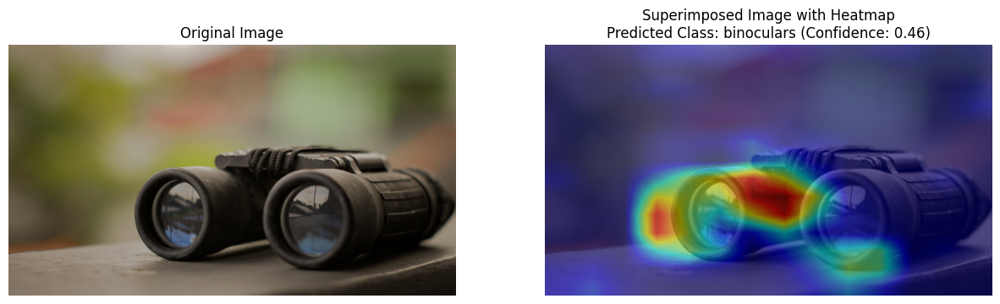

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/binoculars.jpg')


1/1 [==============================] - 1s 572ms/step


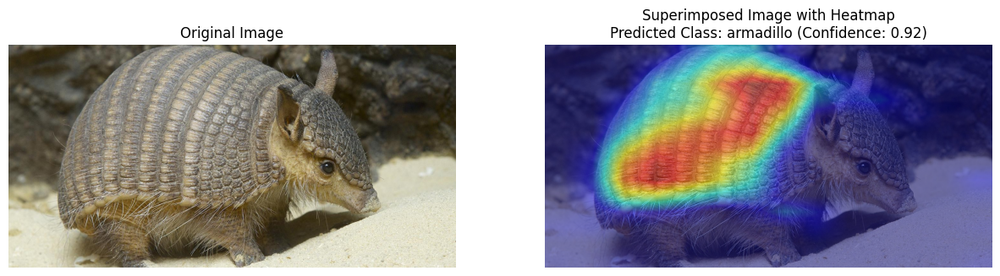

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/Armadillo.jpg')


1/1 [==============================] - 1s 574ms/step


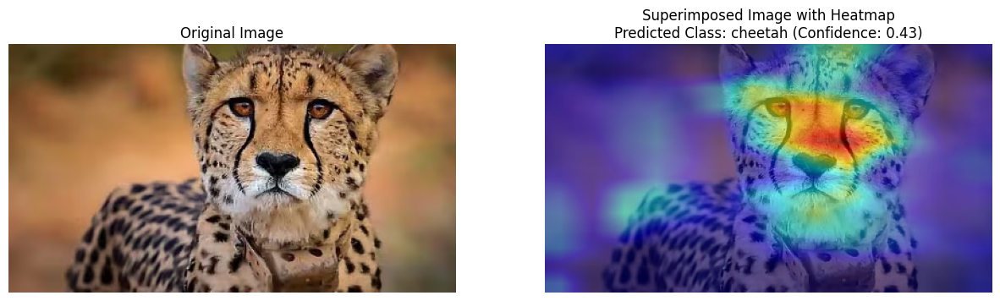

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/cheetah.jpeg')


1/1 [==============================] - 1s 890ms/step


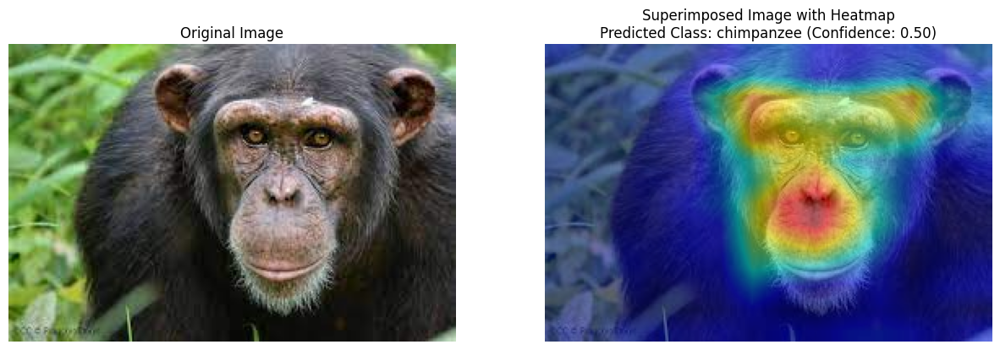

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/chimp2.jpg')


1/1 [==============================] - 1s 558ms/step


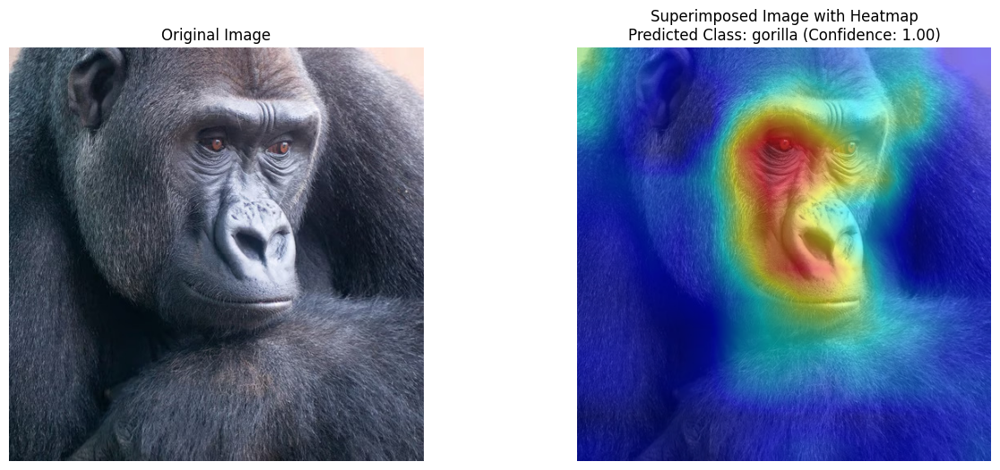

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/gorilla.jpeg')


1/1 [==============================] - 1s 639ms/step


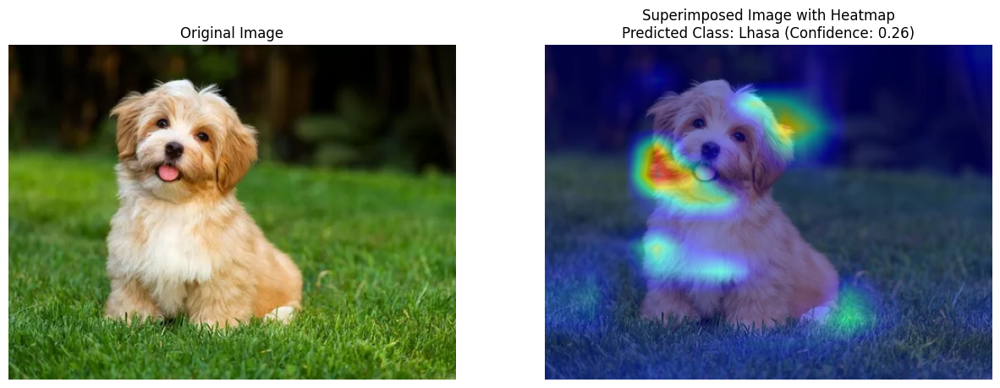

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/dog2.jpg')


1/1 [==============================] - 1s 613ms/step


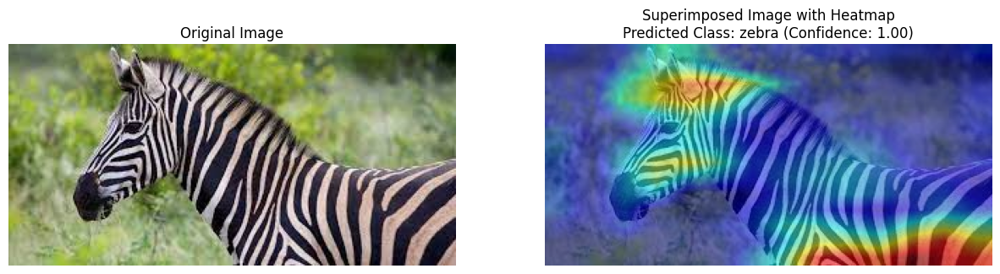

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/zebra.jpg')


1/1 [==============================] - 1s 1s/step


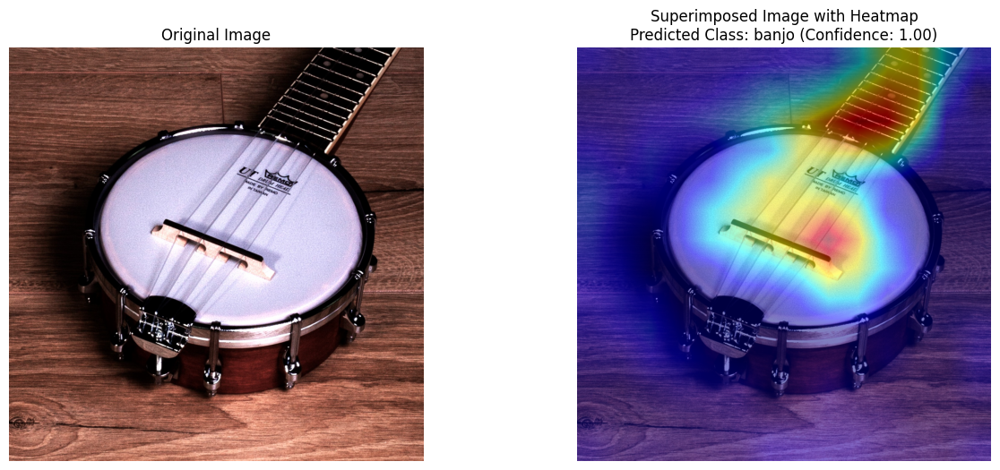

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/banjo.jpg')


1/1 [==============================] - 1s 653ms/step


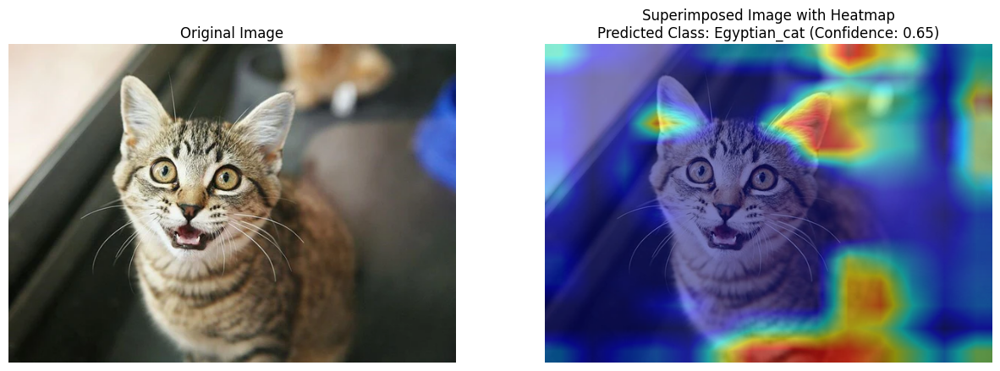

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/cat2.jpg')


1/1 [==============================] - 1s 570ms/step


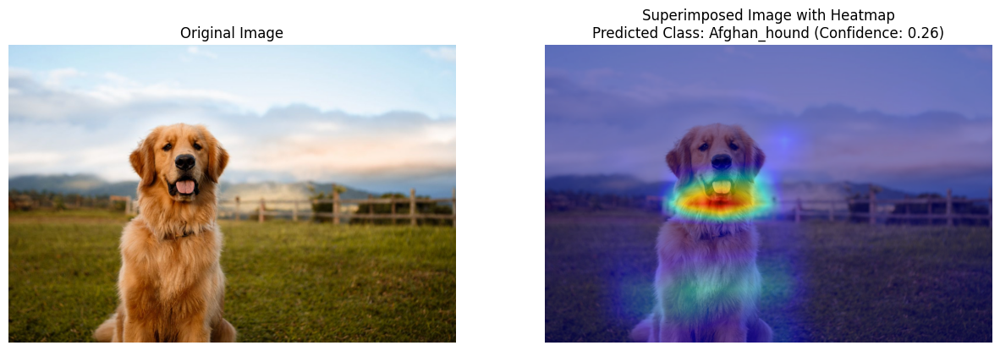

In [ ]:
visualize_original_and_superimposed_image(model, '/content/drive/MyDrive/Dependable AI/dog.jpg')


1/1 [==============================] - 1s 1s/step


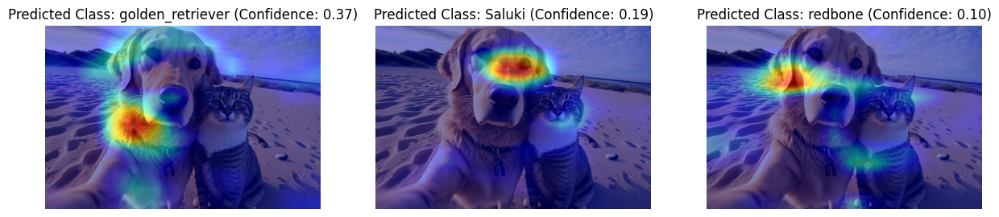

In [ ]:
def visualize_grad_cam_multi_class(model, img_path, target_size=(224, 224), layer_name='block5_conv3', alpha=0.4):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = preprocess_input(np.expand_dims(img_array.copy(), axis=0))

    # Make prediction
    preds = model.predict(img_array)
    class_indices = np.argsort(preds[0])[::-1][:3]
    class_labels = decode_predictions(preds, top=3)[0]

    heatmaps = [get_grad_cam(model, img_path, idx, layer_name) for idx in class_indices]

    overlayed_imgs = [overlay_heatmap(img_path, heatmap) for heatmap in heatmaps]

    return zip(overlayed_imgs, class_labels)


model = tf.keras.applications.VGG16(weights='imagenet', include_top=True)

img_path = '/content/drive/MyDrive/Dependable AI/catand dog.jpg'

overlayed_imgs = visualize_grad_cam_multi_class(model, img_path)

# Plot the images
plt.figure(figsize=(15, 8))
for i, (overlayed_img, class_label) in enumerate(overlayed_imgs):
    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Predicted Class: {class_label[1]} (Confidence: {class_label[2]:.2f})')
    plt.axis('off')

plt.show()
